# Quora Question Pairs

## Identify question pairs that have the same intent.

- Identify which questions asked on Quora are duplicates of questions that have already been asked. 
- This could be useful to instantly provide answers to questions that have already been answered. 
- We are tasked with predicting whether a pair of questions are duplicates or not. 

### 1.1.1 : Basic information about the dataset

- Source of data (kaggle): https://www.kaggle.com/c/quora-question-pairs/data
- Import required library packages like: pandas, numpy, plotly etc.
- Read the training dataset into pandas DataFrame as "df".

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc


df = pd.read_csv("train.csv")


- Shape of the Dataset

In [5]:
df.shape

(404290, 6)

In [6]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
id              404290 non-null int64
qid1            404290 non-null int64
qid2            404290 non-null int64
question1       404290 non-null object
question2       404288 non-null object
is_duplicate    404290 non-null int64
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


We are given a minimal number of data fields here, consisting of:

- id:  Looks like a simple rowID
- qid{1, 2}:  The unique ID of each question in the pair
- question{1, 2}:  The actual textual contents of the questions.
- is_duplicate:  The label that we are trying to predict - whether the two questions are duplicates of each other.

### 1.1.2 : Exploring the data
- Number of duplicate(smilar) and non-duplicate(non similar) questions

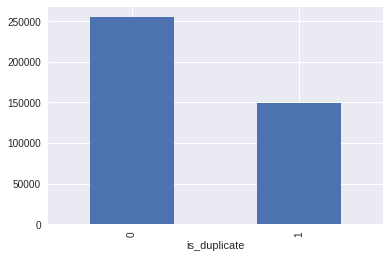

In [8]:
df.groupby("is_duplicate")['id'].count().plot.bar()

In [9]:
print('~> Total number of question pairs for training:\n   {}'.format(len(df)))

~> Total number of question pairs for training:
   404290


In [10]:
print('~> Question pairs are not Similar (is_duplicate = 0):\n   {}%'.format(100 - round(df['is_duplicate'].mean()*100, 2)))
print('\n~> Question pairs are Similar (is_duplicate = 1):\n   {}%'.format(round(df['is_duplicate'].mean()*100, 2)))

~> Question pairs are not Similar (is_duplicate = 0):
   63.08%

~> Question pairs are Similar (is_duplicate = 1):
   36.92%


In [11]:
qids = pd.Series(df['qid1'].tolist() + df['qid2'].tolist())

print ("Total num of Questions are: {}\n".format(len(qids)))
#print len(qids)

print ('Total num of  Unique Questions are: {}\n'.format(len(np.unique(qids))))
#print len(np.unique(qids))

print ('Total num of Multiple Occuring Questions are: {}\n'.format(len(qids) - len(np.unique(qids))))
#print (len(qids) - len(np.unique(qids)))

print ('Multiple occured questions in qid1:  {}\n'.format(len(df[df.duplicated('question1')])))

print ('Multiple occured questions in qid2:  {}\n'.format(len(df[df.duplicated('question2')])))

print ('Multiple occured questions in both qid1 aqnd qid2:{}\n'.format(len(df[df.duplicated('qid1') & df.duplicated('qid2')])))

print ('Number of unique questions that appear multiple times: {}\n'.format(np.sum(qids.value_counts() > 1)))

print ('Max num of time a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()

q_vals=q_vals.values

Total num of Questions are: 808580

Total num of  Unique Questions are: 537933

Total num of Multiple Occuring Questions are: 270647

Multiple occured questions in qid1:  113833

Multiple occured questions in qid2:  105115

Multiple occured questions in both qid1 aqnd qid2:61325

Number of unique questions that appear multiple times: 111780

Max num of time a single question is repeated: 157



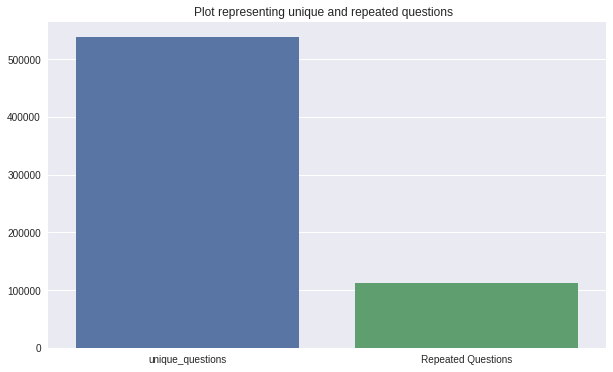

In [12]:

x = ["unique_questions" , "Repeated Questions"]
y = [537933, 111780]

plt.figure(figsize=(10, 6))
plt.title ("Plot representing unique and repeated questions  ")
sns.barplot(x ,y)
plt.show()

- How many question pairs are repeated ???

In [13]:
#checking whether there are any repeated pair of questions

pair_duplicates = df.groupby(['qid1','qid2']).size().reset_index().rename(columns={0:'count'})

print pair_duplicates

          qid1    qid2  count
0            1       2      1
1            3       4      1
2            3  282170      1
3            3  380197      1
4            3  488853      1
5            4   32881      1
6            5       6      1
7            7       8      1
8            9      10      1
9            9  109465      1
10           9  480204      1
11          11      12      1
12          13      14      1
13          15      16      1
14          17      18      1
15          18   38437      1
16          19      20      1
17          21      22      1
18          23      24      1
19          25      26      1
20          27      28      1
21          27   50277      1
22          29      30      1
23          29   44255      1
24          29   47048      1
25          29  160286      1
26          29  407455      1
27          31      32      1
28          31    1101      1
29          31    6937      1
...        ...     ...    ...
404260  537877  537878      1
404261  53

- no duplicate pairs...

In [14]:
pair_duplicates[pair_duplicates['count'] > 1]

,qid1,qid2,count


Max num of time a single question is repeated: 157



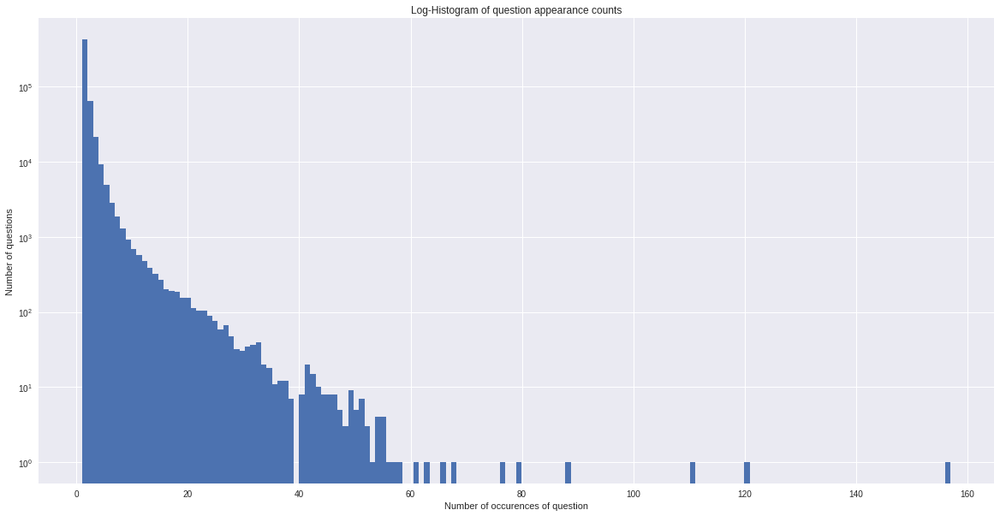

In [15]:
plt.figure(figsize=(20, 10))

plt.hist(qids.value_counts(), bins=160)

plt.yscale('log', nonposy='clip')

plt.title('Log-Histogram of question appearance counts')

plt.xlabel('Number of occurences of question')

plt.ylabel('Number of questions')

print ('Max num of time a single question is repeated: {}\n'.format(max(qids.value_counts()))) 



- Checking whether there are any rows with null values

In [16]:
#Checking whether there are any rows with null values
nan_rows = df[df.isnull().any(1)]
print nan_rows

            id    qid1    qid2                         question1 question2  \
105780  105780  174363  174364    How can I develop android app?       NaN   
201841  201841  303951  174364  How can I create an Android app?       NaN   

        is_duplicate  
105780             0  
201841             0  


- There are two rows in question id 2 which have null values

In [17]:
# Filling the null values with ' '
df = df.fillna('')

nan_rows = df[df.isnull().any(1)]
print nan_rows

Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


### 1.1.3 : Feature Extraction and EDA (I)

Let us now construct a few features like:

- character length of questions 1 and 2
- number of words in question 1 and 2
- normalized word share count.
- We can then have a look at how well each of these separate the two classes.

In [18]:
df['freq_qid1'] = df.groupby('qid1')['qid1'].transform('count') 

print "-> freq_qid1 = frequency of qid1's"

df['freq_qid2'] = df.groupby('qid2')['qid2'].transform('count')

print "\n-> freq_qid2 = frequency of qid2's "

df['q1len'] = df['question1'].str.len() 

print "\n-> q1len = Length of q1"

df['q2len'] = df['question2'].str.len()

print "\n-> q2len = Length of q2"

df['q1_n_words'] = df['question1'].apply(lambda row: len(row.split(" ")))

print "\n-> q1_n_words = num of words i Question 1"
# how lambda is workiing
df['q2_n_words'] = df['question2'].apply(lambda row: len(row.split(" ")))

print "\n-> q2_n_words = num of words i Question 2"



def normalized_word_Common(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return 1.0 * len(w1 & w2)




df['word_Common'] = df.apply(normalized_word_Common, axis=1)

print "\n-> word_Common = (num of common unique words in Question 1 and Question 2)"

def normalized_word_Total(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return 1.0 * (len(w1) + len(w2))



df['word_Total'] = df.apply(normalized_word_Total, axis=1)

print "\n-> word_Total =(Total num of words in Question 1 + Total num of words in Question 2)"

def normalized_word_share(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return 1.0 * len(w1 & w2)/(len(w1) + len(w2))



df['word_share'] = df.apply(normalized_word_share, axis=1)

print "\n-> word_share = (num of common unique words in Question 1 and Question 2)/(Total num of words in Question 1 + Total num of words in Question 2)\n"

print "\n-> freq_q1+q2 = sum total of frequency of qid1 and qid2 "

print "\n-> freq_q1-q2 = absolute difference of frequency of qid1 and qid2 "

df['freq_q1+q2'] = df['freq_qid1']+df['freq_qid2']
df['freq_q1-q2'] = abs(df['freq_qid1']-df['freq_qid2'])

df.to_csv("df_fe_without_preprocessing_train.csv", index=False)

df.head()


-> freq_qid1 = frequency of qid1's

-> freq_qid2 = frequency of qid2's 

-> q1len = Length of q1

-> q2len = Length of q2

-> q1_n_words = num of words i Question 1

-> q2_n_words = num of words i Question 2

-> word_Common = (num of common unique words in Question 1 and Question 2)

-> word_Total =(Total num of words in Question 1 + Total num of words in Question 2)

-> word_share = (num of common unique words in Question 1 and Question 2)/(Total num of words in Question 1 + Total num of words in Question 2)


-> freq_q1+q2 = sum total of frequency of qid1 and qid2 

-> freq_q1-q2 = absolute difference of frequency of qid1 and qid2 


,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4.0,24.0,0.166667,2,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,19.0,0.000000,2,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2.0,20.0,0.100000,4,2


- Here are some questions having only one word.

In [19]:
print "Minimum length of the questions is : " , min(df['q1_n_words'])

print "Minimum length of the questions is : " , min(df['q2_n_words'])

print "\n Questions with minimum length...\n\n"
#print min(df['q2_n_words'])

print df[df['q1_n_words']== 1]
print "\n\n\n"


print df[df['q2_n_words']== 1]

Minimum length of the questions is :  1
Minimum length of the questions is :  1

 Questions with minimum length...


            id    qid1    qid2  question1  \
3306      3306    6553    6554          .   
13016    13016   25026   25027          ?   
17682    17682   33561   33562    deleted   
20794    20794   39204   39205          ?   
23305    23305   33561   43661    deleted   
23884    23884   44699   44700         HH   
25228    25228   47035   47036      What?   
25315    25315   47198   29712    deleted   
39769    39769   33561   72063    deleted   
44619    44619   80055   80056         Na   
57484    57484  101005  101006    grammar   
63712    63712   83329  110823      What?   
86457    86457  145814   81121        Is?   
87861    87861  147899  147900   Deleted.   
96725    96725  161071  161072          ?   
104101  104101  171925  171926          ?   
106577  106577   47035  175527      What?   
108978  108978  178936  178937          i   
109311  109311  179423  1794

            id    qid1    qid2  \
20072    20072   37898   37899   
46596    46596   83328   83329   
47056    47056   84067   84068   
51909    51909   92003   83329   
74304    74304  127360  127361   
105780  105780  174363  174364   
109009  109009  178981  178982   
130637  130637  209606  209607   
144506  144506  228687  228688   
145000  145000  229359  229360   
175282  175282  269923   44699   
181695  181695  278281  278282   
193246  193246  237200  279869   
198913  198913  300250  188110   
201841  201841  303951  174364   
208199  208199  312128  312129   
226925  226925  335645  335646   
231313  231313  179756  341088   
236655  236655  153211  347631   
306878  306878  391795   83329   
322261  322261  448056  147899   
328745  328745  125092  455319   
361480  361480  491330  347631   
384293  384293  516316   37899   

                                                question1      question2  \
20072                             How could I solve this?         ………….. 

The distributions for normalized word share have some overlap on the far right hand side, meaning there are quite a lot of questions with high word similarity but are both duplicates and non-duplicates.

- The average word share and Common no. of words of qid1 and qid2 is more when they are duplicate(Similar)

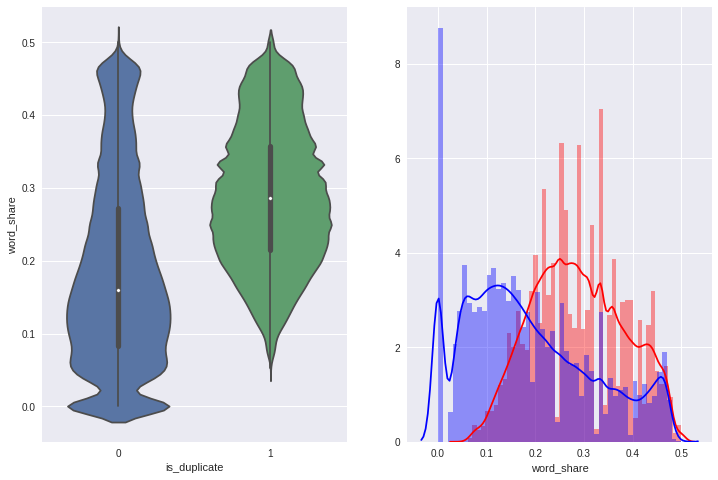

In [20]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)

sns.violinplot(x = 'is_duplicate', y = 'word_share', data = df[0:])

plt.subplot(1,2,2)


sns.distplot(df[df['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'red')

sns.distplot(df[df['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'blue' )


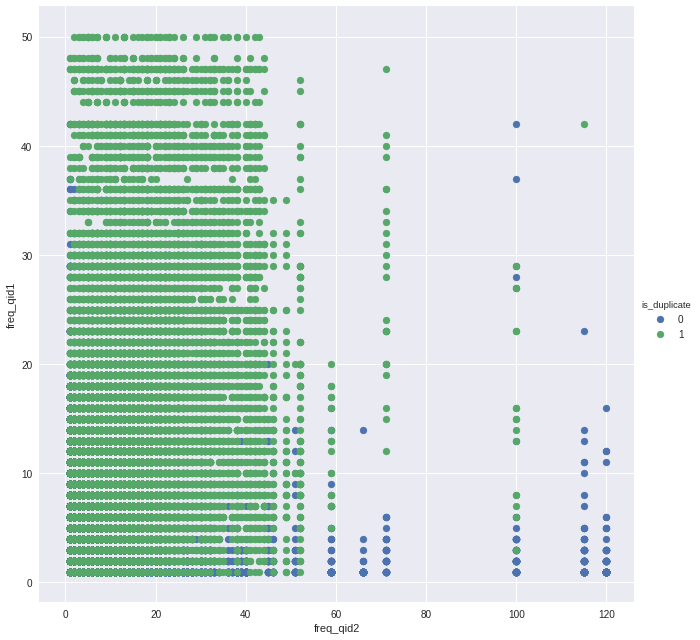

In [21]:
sns.FacetGrid(df, hue="is_duplicate", size=9) \
   .map(plt.scatter, "freq_qid2", "freq_qid1") \
   .add_legend()


- if the frequency of qid1  and qid2 > 15 (aprox) , then its a high chance that the questions are duplicates.

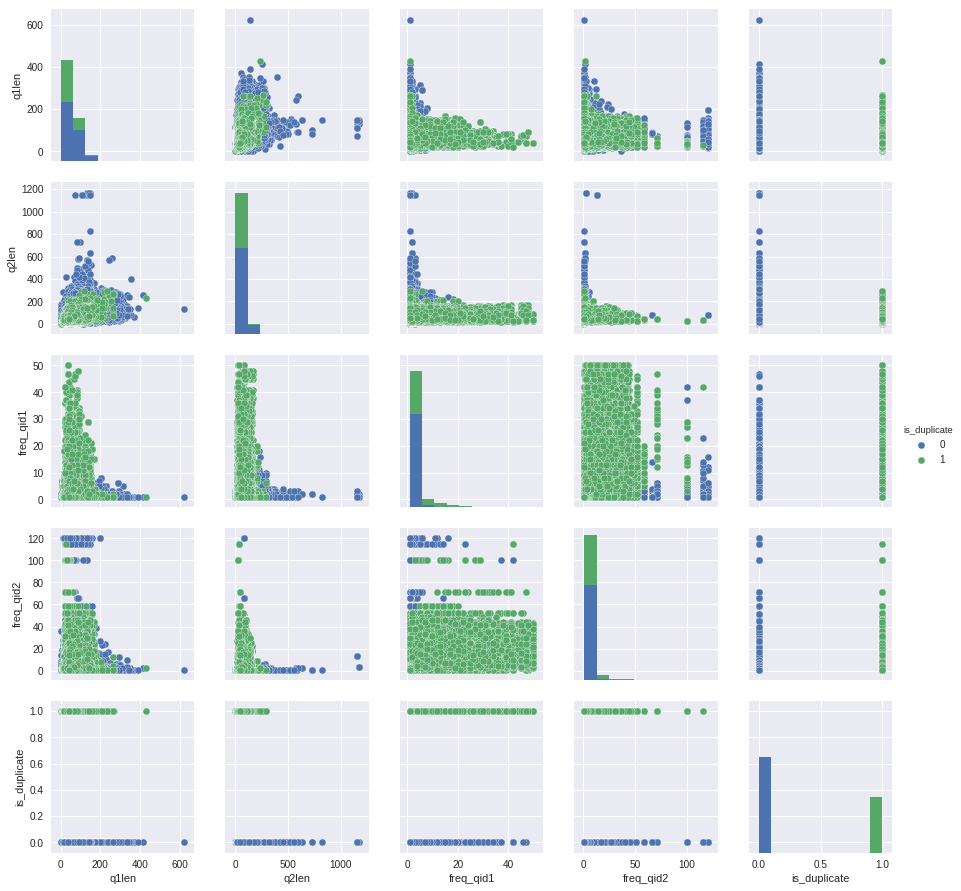

In [22]:
n = df.shape[0]
sns.pairplot(df[['q1len', 'q2len', 'freq_qid1', 'freq_qid2', 'is_duplicate']][0:n], hue='is_duplicate')

- Scatter plot of question pair character lengths
    where:
    - color indicates duplicates 
    - the size the bubbles are according to word share coefficient.

In [23]:
df_subsampled = df[0:20000]

trace = go.Scatter(
    y = df_subsampled['q2len'].values,
    x = df_subsampled['q1len'].values,
    mode='markers',
    marker=dict(
        size= df_subsampled['word_share'].values * 60,
        color = df_subsampled['is_duplicate'].values,
        colorscale='Portland',
        showscale=True,
        opacity=0.5,
        colorbar = dict(title = 'duplicate')
    ),
    text = np.round(df_subsampled['word_share'].values, decimals=2)
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Scatter plot of character lengths of question one and two',
    hovermode= 'closest',
        xaxis=dict(
        title= 'Question 1 length',
        ticklen= 5,
        gridwidth= 2,
        showgrid=False,
        zeroline=False,
        showline=False
    ),
    yaxis=dict(
        title= 'Question 2 length',
        ticklen= 5,
        gridwidth= 2,
        showgrid=False,
        zeroline=False,
        showline=False,
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatterWords')

- Scatter plot of Frequency of question pair
    where:
    - color indicates duplicates 
    - the size the bubbles are according to word share coefficient

In [24]:
df_subsampled = df[0:20000]

trace = go.Scatter(
    y = df_subsampled['freq_qid1'].values,
    x = df_subsampled['freq_qid2'].values,
    mode='markers',
    marker=dict(
        size= df_subsampled['word_share'].values * 40,
        color = df_subsampled['is_duplicate'].values,
        colorscale='Portland',
        showscale=True,
        opacity=0.5,
        colorbar = dict(title = 'duplicate')
    ),
    text = np.round(df_subsampled['word_share'].values, decimals=2)
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Scatter plot of character lengths of question one and two',
    hovermode= 'closest',
        xaxis=dict(
        title= 'Question 1 frequency',
        ticklen= 5,
        gridwidth= 2,
        showgrid=False,
        zeroline=False,
        showline=False
    ),
    yaxis=dict(
        title= 'Question 2 frequency',
        ticklen= 5,
        gridwidth= 2,
        showgrid=False,
        zeroline=False,
        showline=False,
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatterWords')

In [25]:
from IPython.display import display, HTML

df_subsampled = df[0:20000]

df_subsampled['q_n_words_avg'] = np.round((df_subsampled['q1_n_words'] + df_subsampled['q2_n_words'])/2.0).astype(int)
print(df_subsampled['q_n_words_avg'].max())
df_subsampled = df_subsampled[df_subsampled['q_n_words_avg'] < 20]
df_subsampled.head()

134


/home/darshan_excellence/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2,q_n_words_avg
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0,13
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3,10
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4.0,24.0,0.166667,2,0,12
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,19.0,0.000000,2,0,10
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2.0,20.0,0.100000,4,2,10


In [26]:
word_lens = sorted(list(df_subsampled['q_n_words_avg'].unique()))
# make figure
figure = {
    'data': [],
    'layout': {
        'title': 'Scatter plot of char lenghts of Q1 and Q2 (size ~ word share similarity)',
    },
    'frames': []#,
    #'config': {'scrollzoom': True}
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [0, 200], 'title': 'Q1 length'}
figure['layout']['yaxis'] = {
    'range': [0, 200],
    'title': 'Q2 length'#,
    #'type': 'log'
}
figure['layout']['hovermode'] = 'closest'

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 300, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Avg. number of words in both questions:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
word_len = word_lens[0]
dff = df_subsampled[df_subsampled['q_n_words_avg'] == word_len]
data_dict = {
    'x': list(dff['q1len']),
    'y': list(dff['q2len']),
    'mode': 'markers',
    'text': list(dff['is_duplicate']),
    'marker': {
        'sizemode': 'area',
        #'sizeref': 200000,
        'colorscale': 'Portland',
        'size': dff['word_share'].values * 120,
        'color': dff['is_duplicate'].values,
        'colorbar': dict(title = 'duplicate')
    },
    'name': 'some name'
}
figure['data'].append(data_dict)

# make frames
for word_len in word_lens:
    frame = {'data': [], 'name': str(word_len)}
    dff = df_subsampled[df_subsampled['q_n_words_avg'] == word_len]

    data_dict = {
        'x': list(dff['q1len']),
        'y': list(dff['q2len']),
        'mode': 'markers',
        'text': list(dff['is_duplicate']),
        'marker': {
            'sizemode': 'area',
            #'sizeref': 200000,
            'size': dff['word_share'].values * 120,
            'colorscale': 'Portland',
            'color': dff['is_duplicate'].values,
            'colorbar': dict(title = 'duplicate')
        },
        'name': 'some name'
    }
    frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [word_len],
        {
            'frame': {'duration': 300, 'redraw': False},
            'mode': 'immediate',
            'transition': {'duration': 300}
        }
     ],
     'label': word_len,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

In [27]:
word_lens = sorted(list(df_subsampled['q_n_words_avg'].unique()))
# make figure
figure = {
    'data': [],
    'layout': {
        'title': 'Scatter plot of Frequency of Q1 and Q2 (size ~ word share similarity)',
    },
    'frames': []#,
    #'config': {'scrollzoom': True}
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [0,120], 'title': 'Frequency of Q1'}
figure['layout']['yaxis'] = {'range': [0, 50], 'title': 'Frequency of Q2'}

figure['layout']['hovermode'] = 'closest'

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 300, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Avg. number of words in both questions:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
word_len = word_lens[0]
dff = df_subsampled[df_subsampled['q_n_words_avg'] == word_len]
data_dict = {
    'x': list(dff['freq_qid1']),
    'y': list(dff['freq_qid2']),
    'mode': 'markers',
    'text': list(dff['is_duplicate']),
    'marker': {
        'sizemode': 'area',
        #'sizeref': 200000,
        'colorscale': 'Portland',
        'size': dff['word_share'].values * 120,
        'color': dff['is_duplicate'].values,
        'colorbar': dict(title = 'duplicate')
    },
    'name': 'some name'
}
figure['data'].append(data_dict)

# make frames
for word_len in word_lens:
    frame = {'data': [], 'name': str(word_len)}
    dff = df_subsampled[df_subsampled['q_n_words_avg'] == word_len]

    data_dict = {
        'x': list(dff['freq_qid1']),
        'y': list(dff['freq_qid2']),
        'mode': 'markers',
        'text': list(dff['is_duplicate']),
        'marker': {
            'sizemode': 'area',
            #'sizeref': 200000,
            'size': dff['word_share'].values * 120,
            'colorscale': 'Portland',
            'color': dff['is_duplicate'].values,
            'colorbar': dict(title = 'duplicate')
        },
        'name': 'some name'
    }
    frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [word_len],
        {
            'frame': {'duration': 300, 'redraw': False},
            'mode': 'immediate',
            'transition': {'duration': 300}
        }
     ],
     'label': word_len,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

